In [1]:
from ultralytics import YOLO
import numpy as np
from PIL import Image
from pillow_heif import register_heif_opener
import requests
from io import BytesIO
import cv2
import datetime
import matplotlib.pyplot as plt


In [2]:
model = YOLO("yolov8n.pt")
image_file_path = "trial_images/IMG_4194.HEIC"

register_heif_opener() # In case if its an iphone picture

image = Image.open(image_file_path)
array_image = np.array(image)


In [3]:
def getting_bounding_boxes(image):

    results = model.predict(image)

    result = results[0]
    box = result.boxes[0]

    bound_boxes = []

    for box in result.boxes:
        cordenadas_xywh = box.xyxy[0].tolist()
        # cords = [round(x) for x in cords]   ¿cordinates rounded?

        predicted_class = box.cls[0]
        class_name = result.names[predicted_class.item()]

        confidence = round(box.conf[0].item(), 2)

        dict = {"Object type" : class_name,
        "Coordinates" : cordenadas_xywh,
        "Probability" : confidence}

        bound_boxes.append(dict)

    return bound_boxes


In [13]:
def create_image(original_image_array, bound_boxes):

    img = Image.fromarray(original_image_array)

    # Create an OpenCV image from the numeric array
    opencv_image = cv2.cvtColor(original_image_array, cv2.COLOR_RGB2BGR)

    # Annotate bounding boxes on the OpenCV image
    for box_info in bound_boxes:

        coordinates = box_info['Coordinates']
        object_type = box_info['Object type']
        probability = box_info['Probability']

        coordinates = box_info['Coordinates']
        color = (135,206,250)  # Color for the bounding box
        thickness = 5

        # Convert float coordinates to integers
        coordinates = [int(coord) for coord in coordinates]

        # Draw rectangle on the image
        cv2.rectangle(opencv_image, (coordinates[0], coordinates[1]), (coordinates[2], coordinates[3]), color, thickness)

        # Annotate with object type and probability
        label = f"{object_type} ({probability:.2f})"
        cv2.putText(opencv_image, label, (coordinates[0], coordinates[1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255, 255, 255), 4)
        # cv2.FONT_HERSHEY_SIMPLEX, size, color, width

    # Convert the annotated image back to RGB format
    annotated_image = cv2.cvtColor(opencv_image, cv2.COLOR_BGR2RGB)

    # Display or save the annotated image as needed
    return(annotated_image)


In [14]:
def save_image(image_created, file_save_name=None):

    current_time = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")

    if file_save_name is None:
        save_path = f"done_images/picture_{current_time}.jpg"
    else:
        save_path = f"done_images/picture_{file_save_name}_{current_time}.jpg"

    Image.fromarray(image_created).save(save_path)
    print(f"Image saved at: {save_path}")



0: 640x480 5 persons, 3 laptops, 327.2ms
Speed: 8.6ms preprocess, 327.2ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 480)


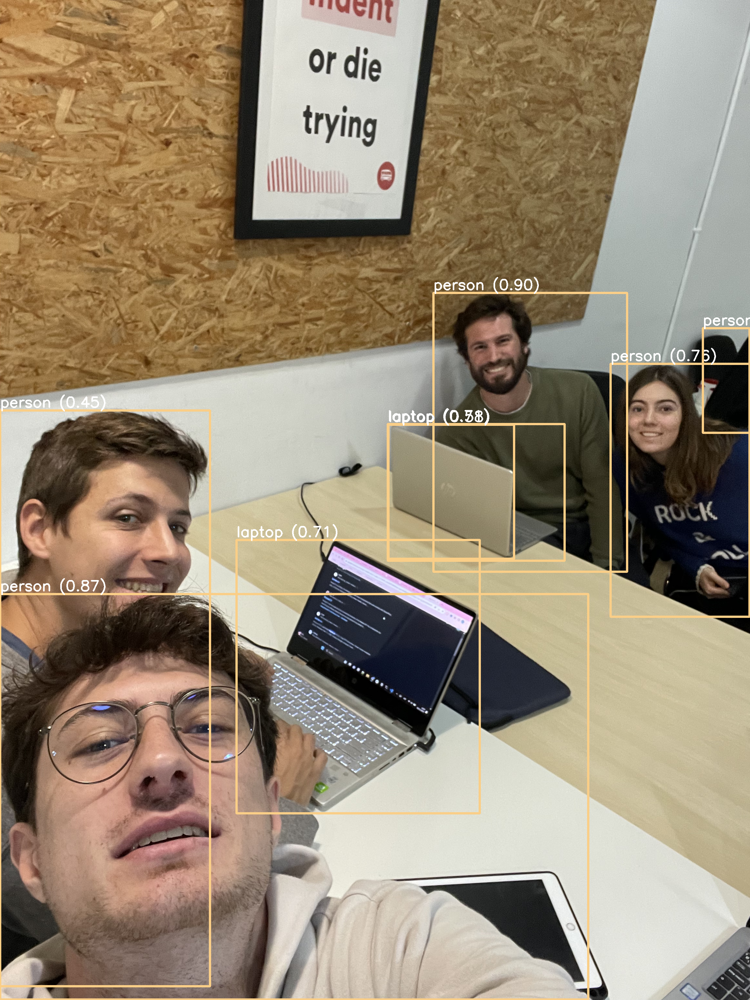

In [15]:
bbs = getting_bounding_boxes(image)
created_image = create_image(array_image, bbs)

# save_image(created_image, "pruebaaaa")

Image.fromarray(created_image)
